In [41]:
import numpy as np
import pandas as pd
import tensorflow as tf
from keras import layers, models
import pathlib
import string
import os
import cv2
import tensorflow_probability as tfp
tfd = tfp.distributions
import matplotlib.pyplot as plt
from keras import backend as K

# **Introduction:**
- In this study, we work to transfer the pattern to the basic face image from the pattern face image, by adjusting the latent space and moving within it.
- Initially, we are working on using VAE with the aim of using its encoder later to extract features during training of the basic neural structure.
- That is, in the study, a pre-trained model was not used on Dataset, such as ImageNet, but rather a VAE neural network was trained with the aim of studying facial expressions and the characteristics of those expressions, and at the same time using the latent space resulting from VAE training to be considered input to the GAN neural network.
- Since, according to the study used, we seek to move within the latent space to find appropriate facial expressions that carry the basic features of the basic facial image in addition to the facial features of the pattern image, therefore we need to move within the basic latent space to find the features contained in both the basic image and the pattern image.
- Since normalization helps bring the values closer together, we will initially normalize the resulting values each time from the latent space, and thus it is considered the first step that helps in moving within the latent space of the image for the hybrid values that carry the features of both sides of the image.
- Since normalization helps bring values closer together and make them smaller in value, therefore we can imagine this idea as moving from a latent space with large values (I am talking here about the field of values that each dimension takes) to a field of smaller values.
- Later, through the location of the pattern image within the latent space, we will be able to reposition it within the latent space again.
- In this methodology, we will be able to reach a hybrid location within the latent space that carries both the features of the pattern image and the basic image.
- *Note:* This methodology requires a huge number of images. It also requires a lot of training time.
- *Note:* I trained the GAN for 100,000 epochs, and the greater the number of rounds, the better results we were able to achieve.
- As we mentioned at the beginning, the location of the basic image within the latent space coming from the VAE network, as well as for the pattern image. The proposed method is with the aim of repositioning within the latent space.
- In the end, through this methodology, we will not get the same latent space (it will be an analogue of the first latent space and have some deviations consistent with the concept of pattern transfer).

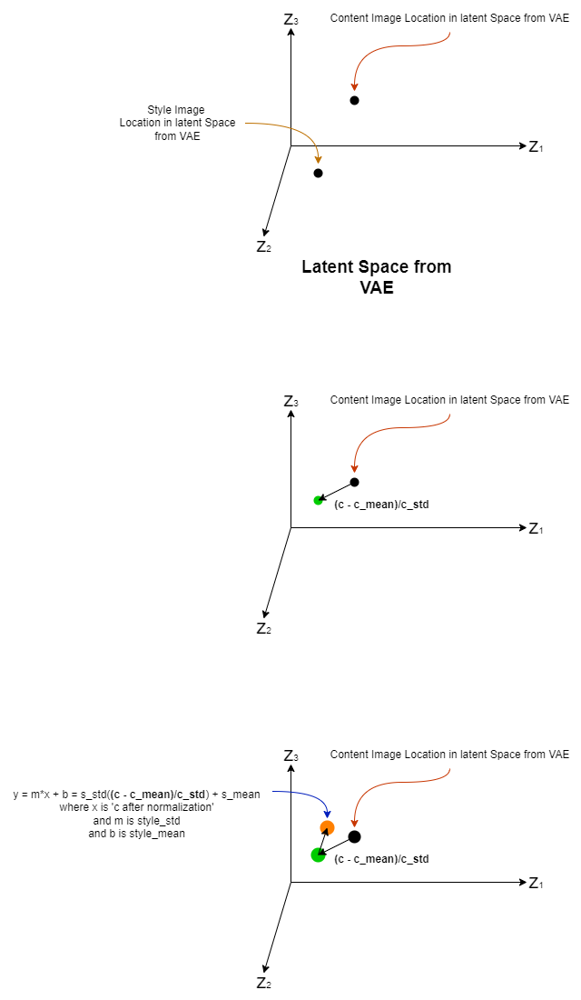

# **Read Dataset:**

In [64]:
allImages = pathlib.Path('/kaggle/input/person-face-dataset-thispersondoesnotexist/thispersondoesnotexist.10k').glob('*.*')
allImages = list(allImages)
len(allImages)

10000

In [43]:
def readImages(allImages):
  images = []
  for img in allImages:
    img = cv2.imread(str(img))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))
    img = img/255
    images.append(img)
  return np.array(images)
images = readImages(allImages[:6000])
images.shape

(6000, 256, 256, 3)

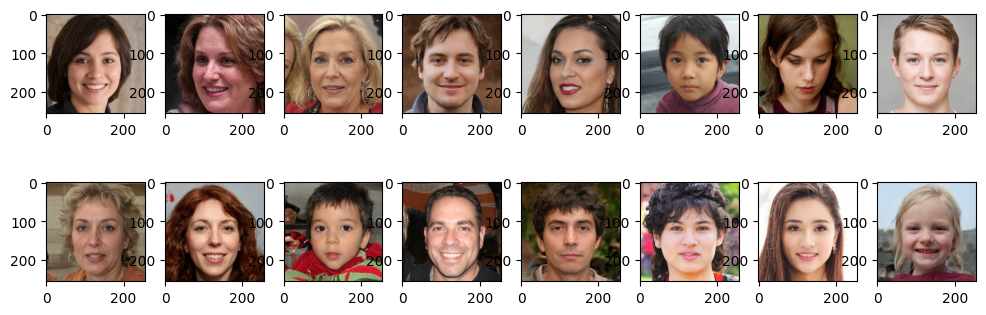

In [44]:
def show_images(images):
    plt.figure(figsize = (12, 4))
    for i in range(16):
      plt.subplot(2, 8, (i + 1))
      plt.imshow(images[i])
    plt.show()
show_images(images)

# **VAE to use it as Features Extract and get Latent Space**

In [5]:
padding  = 'same'
kernel = 3
strides = 1
filter = 16
epochs = 20000
batch_size = 4
image_shape = (256, 256, 3)
image_input = layers.Input(shape = image_shape)
latent_space = 64
eta = 0.00001
weight_decay = 1e-6
use_pre_trained = True

In [6]:
def samples(args):
    z_mean, z_log_v = args
    batch_size = K.shape(z_mean)[0]
    dim = K.shape(z_mean)[1]
    e = K.random_normal(shape = (batch_size, dim))
    return z_mean + tf.exp(0.*z_log_v)*e

In [7]:
def correlation(input, filter, padding, strides, kernel, activation, use_normalization):
    x = input
    for i in range(3):
      x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                        kernel_regularizer = tf.keras.regularizers.L2(0.001))(x)
      if use_normalization:
        x = layers.GroupNormalization(groups = 1)(x)
      x = layers.Activation(activation)(x)
    return x

In [8]:
def decoder(input, filter, skip, kernel, padding, strides, activation, use_normalization = True):
  x = layers.Conv2DTranspose(filter, kernel_size = kernel, padding = padding,
                                strides = 2)(input)
  if use_normalization:
    x = layers.GroupNormalization(groups = 1)(x)
  x = layers.Activation(activation)(x)
  x = layers.concatenate([x, skip])
  x = correlation(x, filter, padding, strides, kernel, activation, use_normalization = use_normalization)
  return x

In [9]:
def encoder(input, filter, kernel, padding, strides, activation, use_normalization = True):
    x = input
    x_c = correlation(x, filter, padding, strides, kernel, activation, use_normalization = use_normalization)
    x = layers.add([x_c, layers.Conv2D(filter, kernel_size = 1, padding = padding,
                                       strides = strides)(x)])
    if use_normalization:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Activation(activation)(x)
    down = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = 2, activation = activation)(x)
    return down, x

## VAE Architecture:

In [10]:
def encoder_decoder(image_input, filter, padding, strides, kernel, activation, use_pre_trained):
    input_vae = image_input
    down1, skip1 = encoder(input_vae, filter, kernel, padding, strides, activation, use_normalization = False)
    down2, skip2 = encoder(down1, filter*2, kernel, padding, strides, activation, use_normalization = False)
    down3, skip3 = encoder(down2, filter*4, kernel, padding, strides, activation, use_normalization = False)
    down4, skip4 = encoder(down3, filter*8, kernel, padding, strides, activation, use_normalization = False)
    down5, skip5 = encoder(down4, filter*16, kernel, padding, strides, activation, use_normalization = False)
    down6, skip6 = encoder(down5, filter*32, kernel, padding, strides, activation, use_normalization = False)
    down7, skip7 = encoder(down6, filter*64, kernel, padding, strides, activation, use_normalization = False)
    output = layers.Flatten()(down7)
    output = layers.Dropout(0.4)(output)
    z_mean = layers.Dense(latent_space, name = 'z_mean')(output)
    z_log_v = layers.Dense(latent_space, name = 'z_log_v')(output)
    z = layers.Lambda(samples, output_shape = (latent_space, ), name = 'latent_space')([z_mean, z_log_v])
    x = layers.Dense(down7.shape[1]*down7.shape[2]*down7.shape[3], kernel_regularizer = tf.keras.regularizers.L2(0.001))(z)
    x = layers.Reshape((down7.shape[1], down7.shape[2], down7.shape[3]))(x)
    x = decoder(x, filter*64, skip7, kernel, padding, strides, activation, use_normalization = True)
    x = decoder(x, filter*32, skip6, kernel, padding, strides, activation, use_normalization = True)
    x = decoder(x, filter*16, skip5, kernel, padding, strides, activation, use_normalization = True)
    x = decoder(x, filter*8, skip4, kernel, padding, strides, activation, use_normalization = True)
    x = decoder(x, filter*4, skip3, kernel, padding, strides, activation, use_normalization = True)
    x = decoder(x, filter*2, skip2, kernel, padding, strides, activation, use_normalization = True)
    x = decoder(x, filter, skip1, kernel, padding, strides, activation, use_normalization = True)
    x = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding, strides = 1)(x)
    output_vae = layers.Activation('sigmoid')(x)
    vae = tf.keras.models.Model(inputs = image_input,
                                   outputs = output_vae, name = 'vae')
    if use_pre_trained:
        vae.load_weights('/kaggle/working/vae.keras')
    return vae, z_mean, z_log_v

> I set True because I trained it previously, and I only retrieve the weights (so as not to retrain).

In [11]:
vae, z_mean, z_log_v = encoder_decoder(image_input, filter, 
                                       padding, strides, 
                                       kernel, 'relu', True)
vae.summary()

Model: "vae"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_1[0][0]']             
                                                                                                  
 activation (Activation)     (None, 256, 256, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['activation[0][0]']          
                                                                                                

In [ ]:
mse_loss = tf.keras.losses.mse(image_input, vae.output)
mse_loss = tf.reduce_mean(mse_loss)
mse_loss = mse_loss*256*256
kl_loss = 1 + z_log_v - tf.exp(z_log_v) - tf.square(z_mean)
kl_loss = tf.reduce_mean(kl_loss)
kl_loss = -0.5*kl_loss
vae.add_loss(kl_loss + mse_loss)
vae.compile(tf.keras.optimizers.Adam(learning_rate = 0.0001))

## **Fit VAE:**

In [ ]:
history = vae.fit(images, images, batch_size = 32, epochs = 70,
                  validation_split = 0.2,
                  callbacks = tf.keras.callbacks.EarlyStopping(patience = 4, monitor = 'val_loss',
                                                             mode = 'min', restore_best_weights = True))

In [ ]:
vae.save('/kaggle/working/vae.keras')

- After completing the VAE training, I will use it to access the latent space of images, as well as feature maps from deep layers.
- **Note: Features must be extracted from the deeper layers of the Encoder architecture.**
- I extracted features from the 3 deepest convolutional layers

In [13]:
E_latent_space_model = tf.keras.models.Model(inputs = image_input,
                                            outputs = vae.get_layer('latent_space').output)
features_model = tf.keras.models.Model(inputs = image_input,
                                            outputs = [vae.get_layer('conv2d_34').output,
                                                       vae.get_layer('activation_27').output,
                                                       vae.get_layer('conv2d_33').output])

# GAN:
## Generator:

- c is Content Image Latent Space
- s in Style Image Latent Space
$$
c_{normalization} = (c - c_{mean})/c_{stddev} \to
$$
$$
y = m*x + b \to y = s_{stddev}*(c_{normalization}) + s_{mean}
$$


In [14]:
class AdaIN(tf.keras.layers.Layer):
  def __init__(self, ep = 1e-10):
    super().__init__()
    self.ep = ep
  def call(self, inputs):
    c, s = inputs
    c_mean, c_var = tf.nn.moments(c, axes = (1,), keepdims = True)
    s_mean, s_var = tf.nn.moments(s, axes = (1,), keepdims = True)
    c_log_v = tf.sqrt(c_var + self.ep)
    s_log_v = tf.sqrt(s_var + self.ep)
    return s_log_v*((c - c_mean)/c_log_v) + s_mean

In [15]:
def decoder_without_skip(input, filter, kernel, padding, strides, activation, use_normalization = True):
  x = layers.Conv2DTranspose(filter, kernel_size = kernel, padding = padding,
                                strides = 2)(input)
  if use_normalization:
    x = layers.GroupNormalization(groups = 1)(x)
  x = layers.Activation(activation)(x)
  return x

In [16]:
def reshape_(latent, shape):
    latent = layers.Dense(shape[0]*shape[1]*shape[2], 
                     kernel_regularizer = tf.keras.regularizers.L2(0.001))(latent)
    latent = layers.Reshape((shape[0], shape[1], shape[2]))(latent)
    return latent

In [17]:
def apply_adain(c, s):
    c = AdaIN()([c, s])
    return c

In [18]:
activation = 'relu'
filter = 16
s_latent_input = layers.Input(shape = latent_space)
c_latent_input = layers.Input(shape = latent_space)
c = apply_adain(c_latent_input, s_latent_input,)
c = reshape_(c, [2, 2, 1024])
x = decoder_without_skip(c, filter*64, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = decoder_without_skip(x, filter*32, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = decoder_without_skip(x, filter*16, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = decoder_without_skip(x, filter*8, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = decoder_without_skip(x, filter*4, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = decoder_without_skip(x, filter*2, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = decoder_without_skip(x, filter, kernel, 
                         padding, strides, 
                         activation, 
                         use_normalization = True)
x = layers.Conv2DTranspose(3, kernel_size = kernel, 
                           padding = padding, strides = 1)(x)
output = layers.Activation('sigmoid')(x)
G = tf.keras.models.Model(inputs = [s_latent_input,
                                    c_latent_input],
                               outputs = output, name = 'G')
G.load_weights('/kaggle/working/G1.keras')
G.summary()

Model: "G"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 64)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 64)]                 0         []                            
                                                                                                  
 ada_in (AdaIN)              (None, 64)                   0         ['input_3[0][0]',             
                                                                     'input_2[0][0]']             
                                                                                                  
 dense_1 (Dense)             (None, 4096)                 266240    ['ada_in[0][0]']              

## **Discriminator**

In [19]:
x = image_input
kernel_size = 3
conv1, skip1 = encoder(x, filter, kernel_size, 
                       padding, strides, 'LeakyReLU', 
                       use_normalization = False)
conv2, skip2 = encoder(conv1, filter*2, kernel_size, 
                       padding, strides, 'LeakyReLU', 
                       use_normalization = False)
conv3, skip3 = encoder(conv2, filter*4, kernel_size, 
                       padding, strides, 'LeakyReLU', 
                       use_normalization = False)
conv4, skip4 = encoder(conv3, filter*8, kernel_size, 
                       padding, strides, 'LeakyReLU', 
                       use_normalization = False)
conv5, skip5 = encoder(conv4, filter*16, kernel_size, 
                       padding, strides, 'LeakyReLU', 
                       use_normalization = False)
conv6, skip6 = encoder(conv5, filter*32, kernel_size, 
                       padding, strides, 'LeakyReLU', 
                       use_normalization = False)
output = layers.Conv2D(1, kernel_size = 3, padding = padding)(conv6)
D = tf.keras.models.Model(inputs = image_input, outputs = [output])
D.compile(loss = ['mse'],
          loss_weights = [1],
          optimizer = tf.keras.optimizers.Adam(learning_rate = eta,
                                                  weight_decay = weight_decay))
D.load_weights('/kaggle/working/D1.keras')
D.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_56 (Conv2D)          (None, 256, 256, 16)         448       ['input_1[0][0]']             
                                                                                                  
 activation_65 (Activation)  (None, 256, 256, 16)         0         ['conv2d_56[0][0]']           
                                                                                                  
 conv2d_57 (Conv2D)          (None, 256, 256, 16)         2320      ['activation_65[0][0]']       
                                                                                            

In [20]:
D.trainable = False
vae.trainable = False
E_latent_space_model.trainable = False
features_model.trainable = False
list_inputs = [s_latent_input,
               c_latent_input]
generate_image = G(list_inputs)
GAN = tf.keras.models.Model(inputs = list_inputs,
                            outputs = [D(generate_image),
                                       features_model(generate_image),
                                       features_model(generate_image),
                                       E_latent_space_model(generate_image)])
GAN.compile(loss = ['mse','mse', 'mse','mse', 'mse', 'mse', 'mse', 'mae'],
            loss_weights = [1, 0.65, 0.65, 0.65, 0.2, 0.2, 0.2, 0.05],
            optimizer = tf.keras.optimizers.Adam(learning_rate = eta,
                                                    weight_decay = weight_decay))
GAN.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 64)]                 0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 64)]                 0         []                            
                                                                                                  
 G (Functional)              (None, 256, 256, 3)          1599987   ['input_2[0][0]',             
                                                          5          'input_3[0][0]']             
                                                                                                  
 model_2 (Functional)        (None, 4, 4, 1)              1119092   ['G[0][0]']             

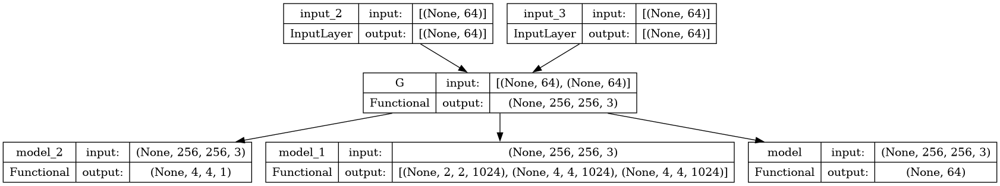

In [21]:
tf.keras.utils.plot_model(GAN, show_shapes = True)

In [39]:
def show_samples(firstImage, secondImage):
  allImages = [tf.squeeze(firstImage[:1]), tf.squeeze(secondImage[:1]),
              tf.squeeze(G.predict([E_latent_space_model.predict(secondImage[:1], verbose = 0),
                                    E_latent_space_model.predict(firstImage[:1], verbose = 0)], verbose = 0)),]
  allLabels = ['Content Img', 'Style Img', 'Generated']
  plt.figure(figsize = (5, 4))
  for i in range(3):
    plt.subplot(1, 4, (i + 1))
    plt.imshow(allImages[i])
    plt.title(allLabels[i])
  plt.show()

In [40]:
def generate_random_images(batch_size):
  randindexs = np.random.randint(low = 0, high = len(images), size = (batch_size, ))
  realImages = images[randindexs]
  return realImages

In [24]:
def save(D, G):
    D.save('/kaggle/working/D1.keras')
    G.save('/kaggle/working/G1.keras')

In [ ]:
batch_size = 2
for i in range(epochs):
  realImages = generate_random_images(batch_size)
  fakeImages = G.predict([E_latent_space_model.predict(generate_random_images(batch_size), verbose = 0),
                          E_latent_space_model.predict(generate_random_images(batch_size), verbose = 0)],
                          verbose = 0)
  imagesData = np.vstack([realImages, 
                          fakeImages])
  real = tf.ones(shape = (batch_size, 4, 4, 1))
  fake = tf.zeros(shape = (batch_size, 4, 4, 1))
  allLabel = np.concatenate([real ,fake])
  allDloss = D.train_on_batch(imagesData, 
                              [allLabel])
  first_images_samples = generate_random_images(batch_size)
  content_images = generate_random_images(batch_size)
  content_latent = E_latent_space_model.predict(content_images, verbose = 0)
  style_images = generate_random_images(batch_size)
  style_latent = E_latent_space_model.predict(style_images, verbose = 0)
  s1, s2, s3 = features_model.predict(style_images, verbose = 0)
  c1, c2, c3 = features_model.predict(content_images, verbose = 0)
  latent = AdaIN()([content_latent, style_latent])
  allGanloss, g1, g2, g3, g4, g5, g6, g7, g8  = GAN.train_on_batch([style_latent, 
                                                                    content_latent],
                                              [tf.ones(shape = (batch_size, 4, 4, 1)), 
                                               [c1, c2, c3],
                                               [s1, s2, s3], 
                                               latent])
  if i%100 == 0:
    print('Epoch/Epochs: {}/{}'.format(i, epochs))
    msg = 'D_label_loss: {}, GAN_label_loss: {}, content_loss: {}, style_loss: {}, latent: {}'.format(allDloss, g1, 
                                                                                                (g2 + g3 + g4), 
                                                                                                (g5 + g6 + g7), g8)
    print(msg)
#     show_samples(generate_random_images(batch_size), 
#                  generate_random_images(batch_size))
#     show_samples(generate_random_images(batch_size), 
#                  generate_random_images(batch_size))
  if i%500 == 0:
    save(D, G)

# Results

## **The content image is the same and the style image is changed**

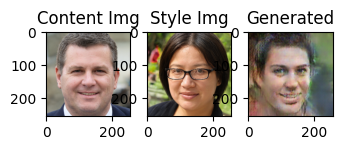

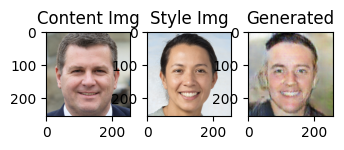

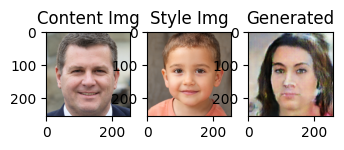

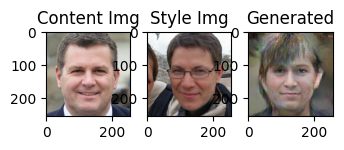

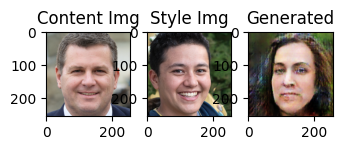

...

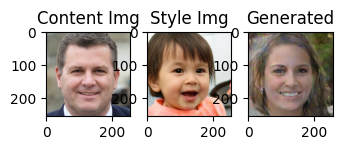

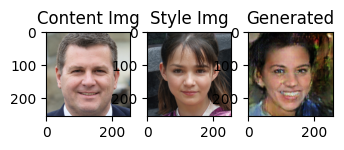

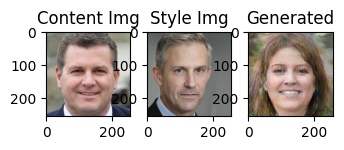

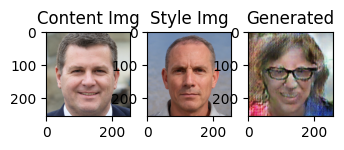

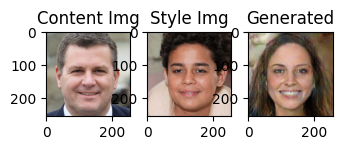

In [29]:
contentImage = generate_random_images(batch_size)
for i in range(30):
    show_samples(contentImage,
             generate_random_images(batch_size))

## **The content image is changed and the style image is changed at every time:**

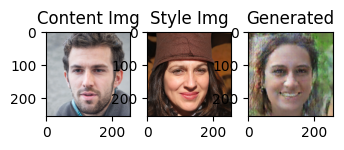

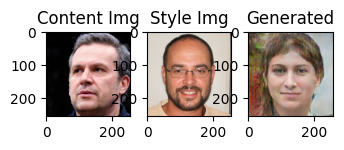

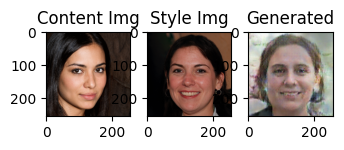

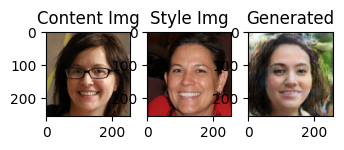

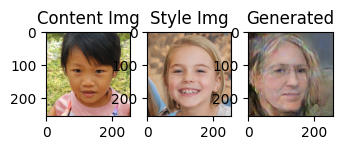

...

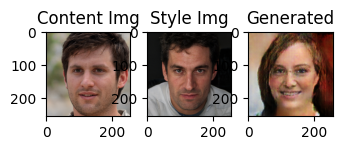

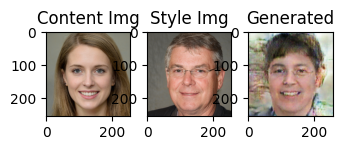

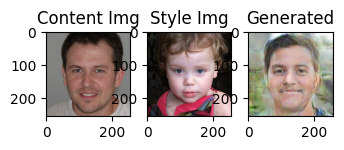

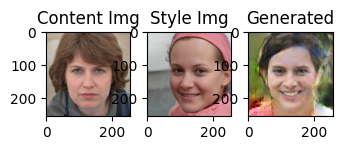

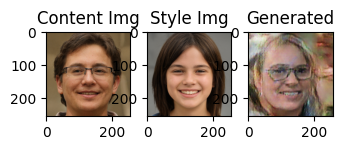

In [32]:
for i in range(40):
    show_samples(generate_random_images(batch_size),
             generate_random_images(batch_size))

## **In both directions:**
> In this experiment, for each image (content image and style image) we will flip each of them to see the image that will be generated.

---------Start Example---------


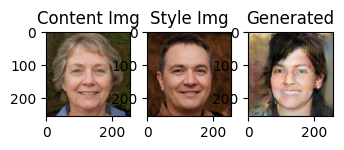

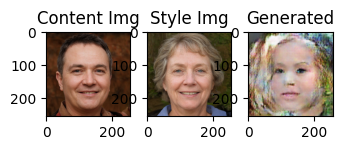

---------end Example---------
---------Start Example---------


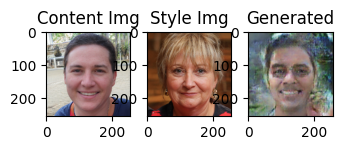

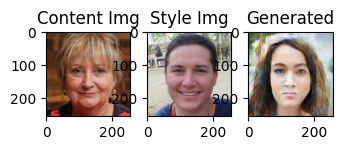

---------end Example---------
---------Start Example---------


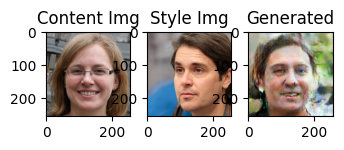

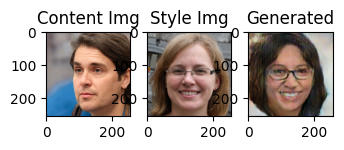

---------end Example---------
---------Start Example---------


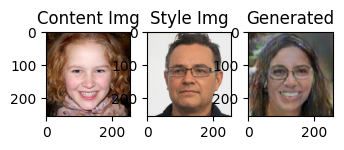

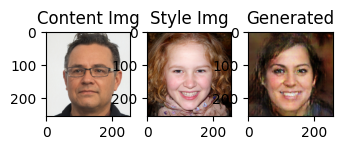

---------end Example---------
---------Start Example---------


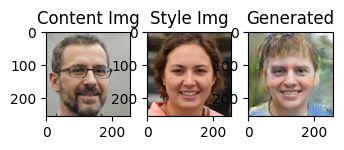

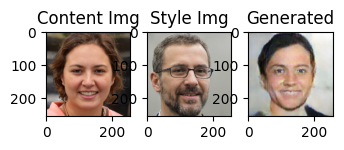

---------end Example---------
---------Start Example---------


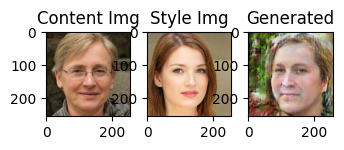

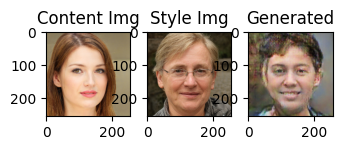

---------end Example---------
---------Start Example---------


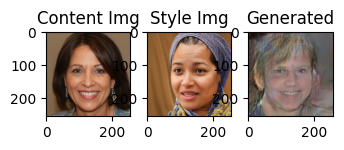

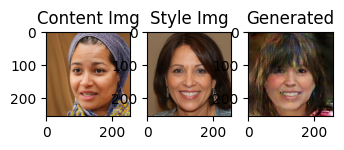

---------end Example---------
---------Start Example---------


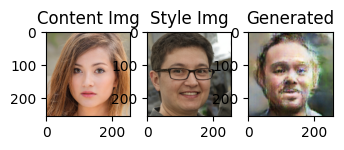

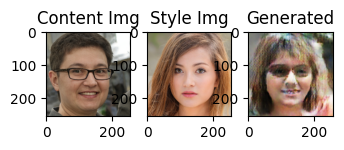

---------end Example---------
---------Start Example---------


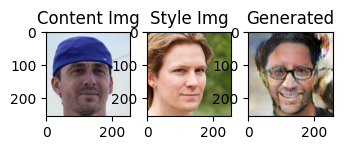

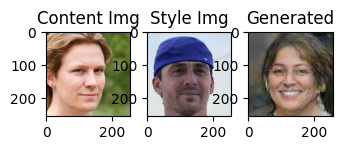

---------end Example---------
---------Start Example---------


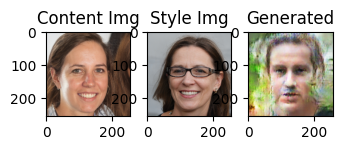

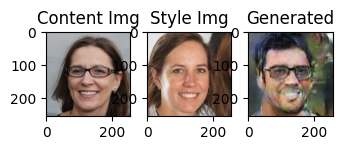

---------end Example---------
---------Start Example---------


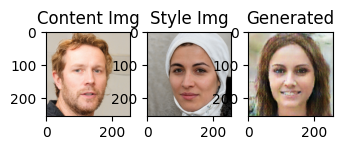

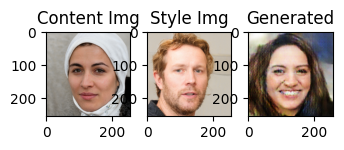

---------end Example---------
---------Start Example---------


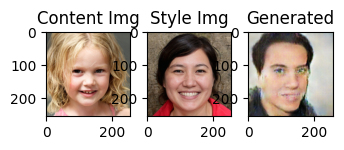

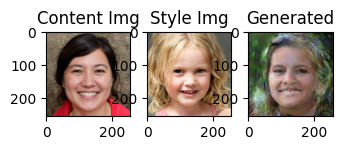

---------end Example---------
---------Start Example---------


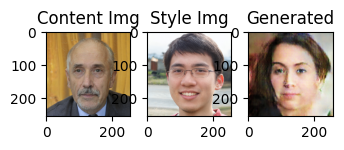

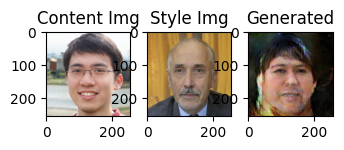

---------end Example---------
---------Start Example---------


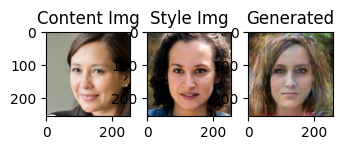

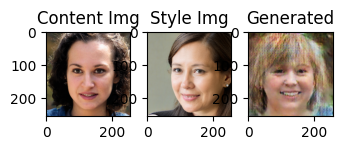

---------end Example---------
---------Start Example---------


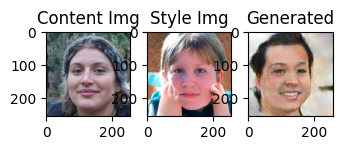

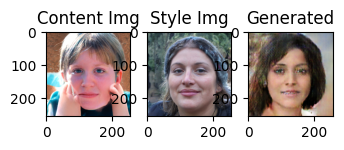

---------end Example---------
---------Start Example---------


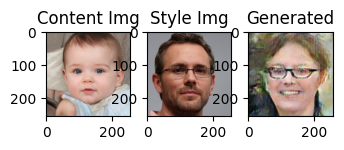

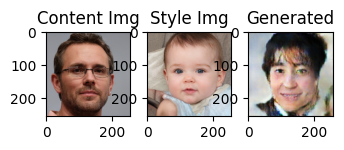

---------end Example---------
---------Start Example---------


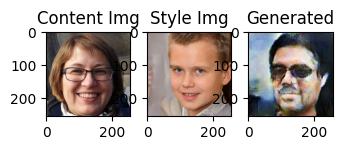

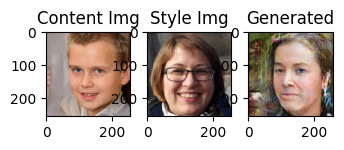

---------end Example---------
---------Start Example---------


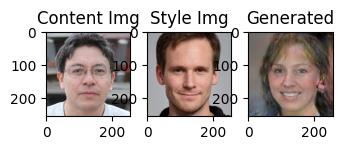

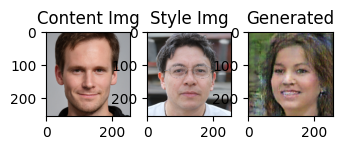

---------end Example---------
---------Start Example---------


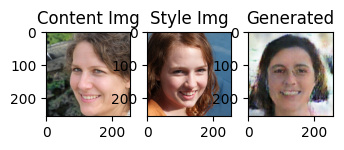

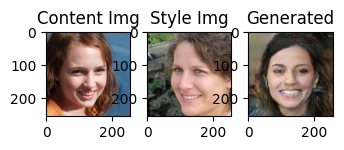

---------end Example---------
---------Start Example---------


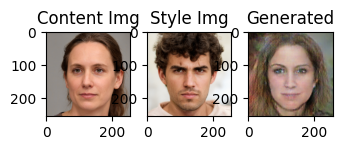

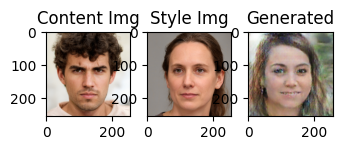

---------end Example---------
---------Start Example---------


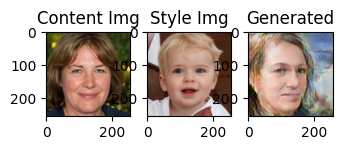

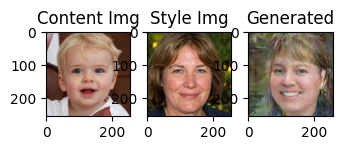

---------end Example---------
---------Start Example---------


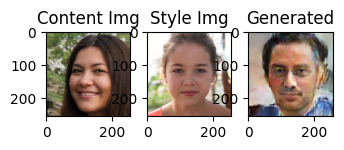

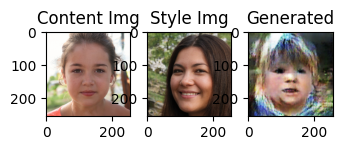

---------end Example---------
---------Start Example---------


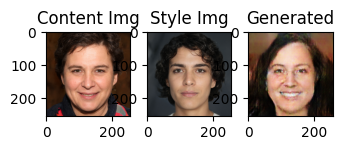

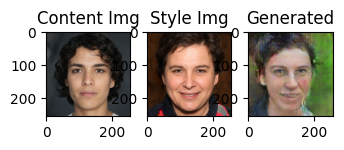

---------end Example---------
---------Start Example---------


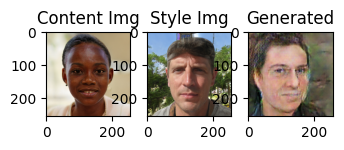

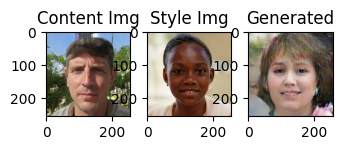

---------end Example---------
---------Start Example---------


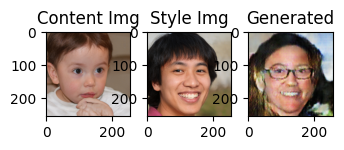

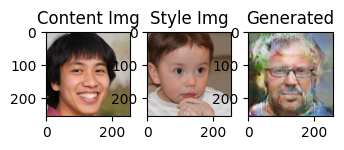

---------end Example---------
---------Start Example---------


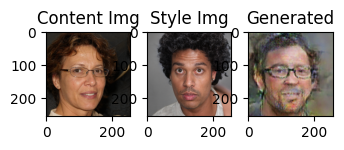

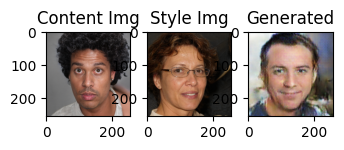

---------end Example---------
---------Start Example---------


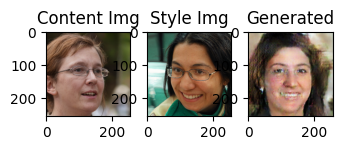

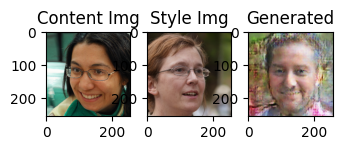

---------end Example---------
---------Start Example---------


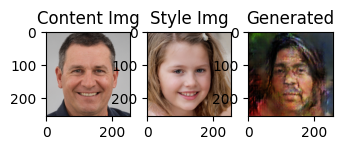

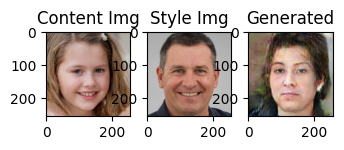

---------end Example---------
---------Start Example---------


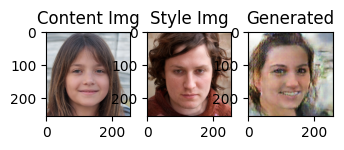

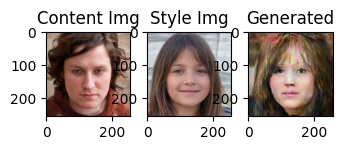

---------end Example---------
---------Start Example---------


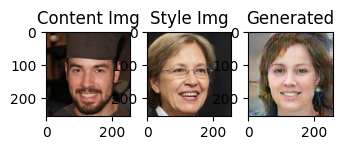

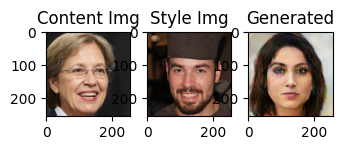

---------end Example---------
---------Start Example---------


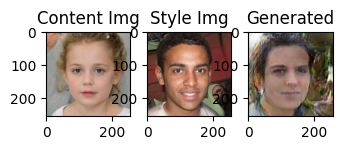

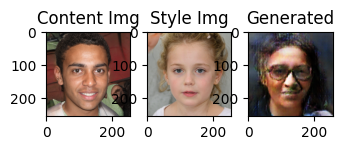

---------end Example---------
---------Start Example---------


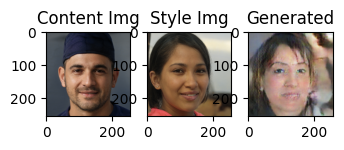

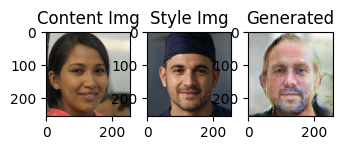

---------end Example---------
---------Start Example---------


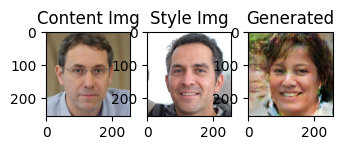

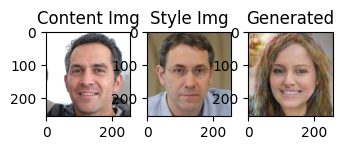

---------end Example---------
---------Start Example---------


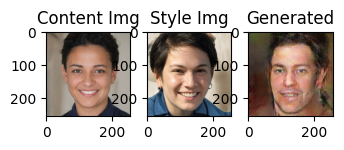

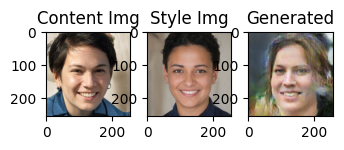

---------end Example---------
---------Start Example---------


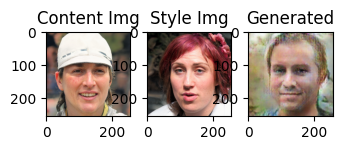

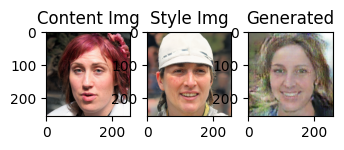

---------end Example---------
---------Start Example---------


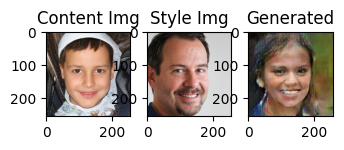

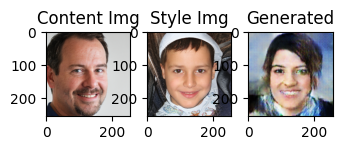

---------end Example---------
---------Start Example---------


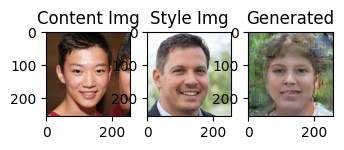

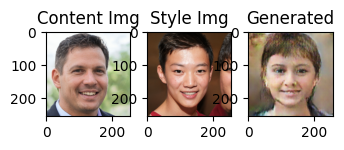

---------end Example---------
---------Start Example---------


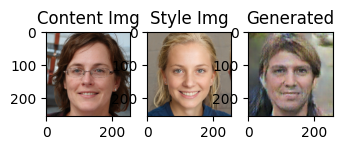

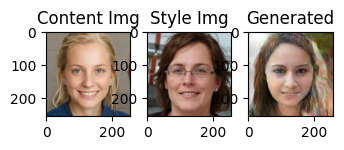

---------end Example---------
---------Start Example---------


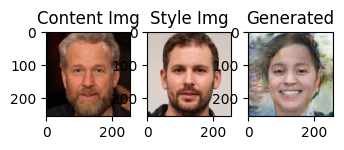

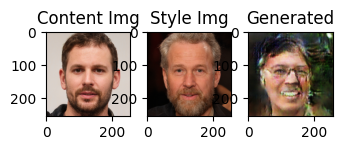

---------end Example---------
---------Start Example---------


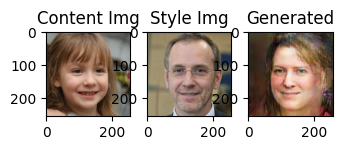

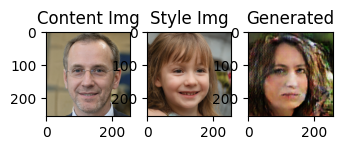

---------end Example---------


In [33]:
for i in range(40):
    x1 = generate_random_images(batch_size)
    x2 = generate_random_images(batch_size)
    print('---------Start Example---------')
    show_samples(x1,x2)
    show_samples(x2,x1)
    print('---------end Example---------')

# **To confirm:**
- You may be wondering why I can't apply AdaIN directly from VAE and get the same results! Why did you use GAN?
- In the following example, I will review the latent space, which is the input of the generator in the GAN structure, and at the same time I will pass the image that was generated through the Generator, and thus, according to your question, it is assumed that I will obtain the same latent space! But I didn't get that. The values from the latent space are different for each structure.
- That is, the move you made led to a change in the dimensions of the latent space (the field of values), which at the same time led to a different grating for the generator, which is different from VAE.

In [65]:
style = generate_random_images(batch_size)
content = generate_random_images(batch_size)
style_latent = E_latent_space_model.predict(style[:1], verbose = 0)
content_latent = E_latent_space_model.predict(content[:1], verbose = 0)
adaIn_latent = AdaIN()([content_latent, style_latent])
image = tf.squeeze(G.predict([style_latent, content_latent], verbose = 0))
latent_from_vae = E_latent_space_model.predict(tf.expand_dims(image, axis = 0), verbose = 0)

In [66]:
latent_from_vae.shape

(1, 64)

In [69]:
pd.DataFrame({
    'input for Generator': tf.squeeze(adaIn_latent), 
    'latent using VAE from image generated': tf.squeeze(latent_from_vae)
}).head(n = 30)

,input for Generator,latent using VAE from image generated
0,0.579410,2.371584
1,-1.611052,-0.144285
2,0.130502,-1.478055
3,0.450993,-1.073457
4,0.393626,0.201098
5,0.515120,-0.773262
6,0.896228,1.092096
7,-1.218612,-1.731280
8,-1.834639,-2.309808
9,0.624291,0.826346


> We can explain this by saying that GAN intertwines what it wants, which is different from VAE intertwining in how it intertwines and what it wants to intertwine.

**note:**
- You will notice after a period of training that the generator generates an image that is not similar to the content image and the style image, but as you continue training, the generator will understand and adjust the interlacing it is making.
- The training process was limited to a small number of images (perhaps some of them do not include a number of diverse samples, for example, there are not many people with dark skin, and also there are not many people with a chin).